# Assignment 2: Basic Image Operations and Filtering

## Objectrive:
The objective of this assignment is to reinforce my understanding of basic image operations and filtering techniques in computer vision. I will implement these operations from scratch using a programming language (e.g., Python) and basic libraries like NumPy.

### Installing and importing libraries to be used in this assignment:

In [1]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install matplotlib

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install scipy

Note: you may need to restart the kernel to use updated packages.


In [4]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
from scipy import ndimage

### Images pair to be used for visualization

In [5]:
# the images have been placed in the same directory as this notebook
image1="pic3.jpg"
image2="mars.jpg"

### Original Images Visualisation

In [6]:
# function to read image using OpenCV
def read_image(image):
    # if the input is a path to the actual image, read it using OpenCV and convert to RGB color format
    if isinstance(image,str):
        image = cv2.imread(image)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # if the input is already a numpy array of the already read image, then I will simply return the same array
    elif isinstance(image,np.ndarray):
        image=image
    else:
        raise ValueError("Check input image!!!") # raise error if any other format is provided as input
        
    return image

In [7]:
# function to display images in one single figure and all the images will be displayed as a sub-figure using matplotlib
def display_images(images):
    '''
    The input to this function is a list of images which
    can be list of paths or list or pre-processed numpy array of pixels.
    '''
    fig = plt.figure(figsize=(20, 20))
    
    for i, image in enumerate(images):
        image=read_image(image)
        
        ax = fig.add_subplot(1, len(images), i+1)
        ax.imshow(image)
        ax.axis('off')
        plt.title("Image No. "+str(i+1))        
    
    plt.show()

The read_image() and display_images() functions are going to be used throughout this notebook to ease my work and accomplish the tasks efficiently without repeating same code again and again. This is also an example of modularizing the code.

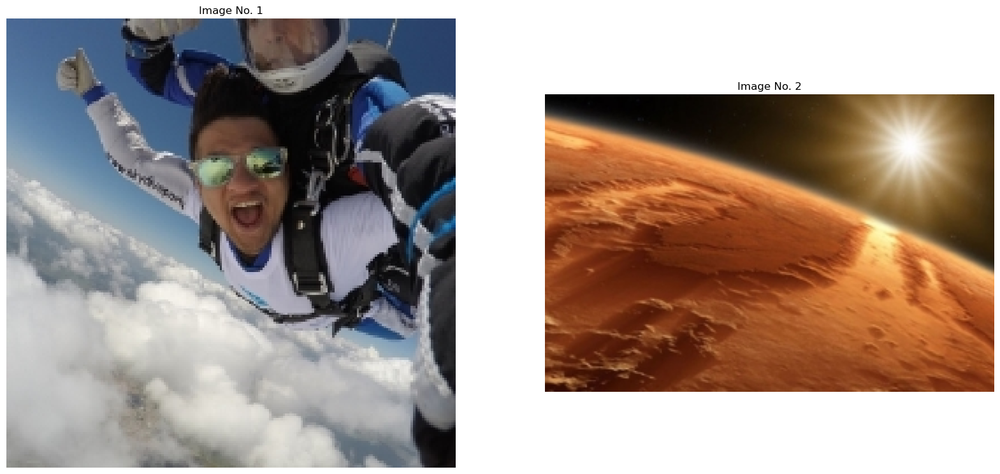

In [8]:
# let's see the original images
display_images([image1,image2])

## Task 1: Image Arithmetic Operations:

1. Implement functions for basic image arithmetic operations: addition, subtraction, multiplication, and division.
2. Apply these operations to pairs of images and analyze the results.
3. Discuss the importance of data type selection in image arithmetc.

### Function to preprocess(resize) image2 to ensure/match the image dimensions

In [9]:
# this function is to ensure that image2 is of the same dimensions (h x w) as image1
# else I will resize image2 using OpenCV to match the dimensions of image1
def pre_processing_style_image(image1,image2):
    '''
    The inputs to this function:
    1. image1 ==> first image as numpy array
    2. image2 ==> second image as numpy array
    '''
    if image2.shape[:2] != image1.shape[:2]:
        image2 = cv2.resize(image2, image1.shape[:2][::-1])
    return image2

### Function to perform Image Addition operation

In [10]:
def image_addition(image1, image2, avoid_overflow=1):
    '''
    The inputs to this function:
    1. image1 ==> first image as numpy array or its path as str
    2. image2 ==> second image as numpy array or its path as str
    3. avoid_overflow ==> change the datatype of the pixel values before addition to avoid mathematical overflow, default = 1
    '''
    # read input images
    image1=read_image(image1)
    image2=read_image(image2)
    
    # resizing image2 to match image1 dimensions
    image2=pre_processing_style_image(image1,image2)

    #original image dimensions
    height, width, _ = image1.shape

    # setting up an empty canvas of complete black image to be replaced with image pixels later
    added_image = np.zeros(image1.shape).astype("uint8")

    # two 'for' loops (for width and height) will calculate and replace every pixel from the addition of two images
    for w in range(width):
        for h in range(height):
            r1, g1, b1 = image1[h, w]
            r2, g2, b2 = image2[h, w]

            # Perform addition and ensure values are within 0-255 range
            if avoid_overflow==1:
                # convert datatype from uint8 to uint16 to avoid addition overflow and wrapping around
                r = min(r1.astype('uint16') + r2.astype('uint16'), 255)
                g = min(g1.astype('uint16') + g2.astype('uint16'), 255)
                b = min(b1.astype('uint16') + b2.astype('uint16'), 255)
            else:
                # in this case values will wrap around the max limit 255
                r = r1 + r2
                g = g1 + g2
                b = b1 + b2

            added_image[h, w] = (r, g, b)
    
    return added_image

### Function to perform Image Subtraction operation

In [11]:
def image_subtraction(image1, image2, avoid_overflow=1):
    '''
    The inputs to this function:
    1. image1 ==> first image as numpy array or its path as str
    2. image2 ==> second image as numpy array or its path as str
    3. avoid_overflow ==> change the datatype of the pixel values before subtraction to avoid mathematical overflow, default = 1
    '''
    # read input images
    image1=read_image(image1)
    image2=read_image(image2)

    # resizing image2 to match image1 dimensions
    image2=pre_processing_style_image(image1,image2)

    #original image dimensions
    height, width, _ = image1.shape

    # setting up an empty canvas of complete black image to be replaced with image pixels later
    subtracted_image = np.zeros(image1.shape).astype("uint8")

    # two 'for' loops (for width and height) will calculate and replace every pixel from the subtraction between two images
    for w in range(width):
        for h in range(height):
            r1, g1, b1 = image1[h, w]
            r2, g2, b2 = image2[h, w]

            # Perform subtraction and ensure values are within 0-255 range
            if avoid_overflow==1:
                # convert datatype from uint8 to uint16 to avoid subtraction overflow and wrapping around
                r = max(r1.astype('int16') - r2.astype('int16'), 0)
                g = max(g1.astype('int16') - g2.astype('int16'), 0)
                b = max(b1.astype('int16') - b2.astype('int16'), 0)
            else:
                # in this case values will wrap around the min limit 0
                r = r1 - r2
                g = g1 - g2
                b = b1 - b2

            subtracted_image[h, w] = (r, g, b)
    
    return subtracted_image

### Function to perform Image Multiplication operation

In [12]:
def image_multiplication(image1, image2, avoid_overflow=1):
    '''
    The inputs to this function:
    1. image1 ==> first image as numpy array or its path as str
    2. image2 ==> second image as numpy array or its path as str
    3. avoid_overflow ==> change the datatype of the pixel values before multiplication to avoid mathematical overflow, default = 1
    '''
    # read input images
    image1=read_image(image1)
    image2=read_image(image2)

    # resizing image2 to match image1 dimensions
    image2=pre_processing_style_image(image1,image2)

    #original image dimensions
    height, width, _ = image1.shape

    # setting up an empty canvas of complete black image to be replaced with image pixels later
    multiplied_image = np.zeros(image1.shape).astype("uint8")

    # two 'for' loops (for width and height) will calculate and replace every pixel from the multiplication between two images
    for w in range(width):
        for h in range(height):
            r1, g1, b1 = image1[h, w]
            r2, g2, b2 = image2[h, w]

            # Perform multiplication and ensure values are within 0-255 range
            if avoid_overflow==1:
                # convert datatype from uint8 to uint16 to avoid multiplication overflow and wrapping around
                r = min(r1.astype('uint16') * r2.astype('uint16'), 255)
                g = min(g1.astype('uint16') * g2.astype('uint16'), 255)
                b = min(b1.astype('uint16') * b2.astype('uint16'), 255)
            else:
                # in this case values will wrap around the max limit 255
                r = r1 * r2
                g = g1 * g2
                b = b1 * b2

            multiplied_image[h, w] = (r, g, b)
    
    return multiplied_image

### Function to perform Image Division operation

In [13]:
def image_division(image1, image2):
    '''
    The inputs to this function:
    1. image1 ==> first image as numpy array or its path as str
    2. image2 ==> second image as numpy array or its path as str
    '''
    # read input images
    image1=read_image(image1)
    image2=read_image(image2)

    # resizing image2 to match image1 dimensions
    image2=pre_processing_style_image(image1,image2)

    #original image dimensions
    height, width, _ = image1.shape

    # setting up an empty canvas of complete black image to be replaced with image pixels later
    divided_image = np.zeros(image1.shape).astype("uint8")

    # two 'for' loops (for width and height) will calculate and replace every pixel from the division between two images
    for w in range(width):
        for h in range(height):
            r1, g1, b1 = image1[h, w]
            r2, g2, b2 = image2[h, w]

            # Perform division and ensure there is no division by 0
            r = r1 if r2==0 else r1/r2
            g = g1 if g2==0 else g1/g2
            b = b1 if b2==0 else b1/b2

            divided_image[h, w] = (r, g, b)
    
    return divided_image

### Let's apply these functions to my images

### Addition

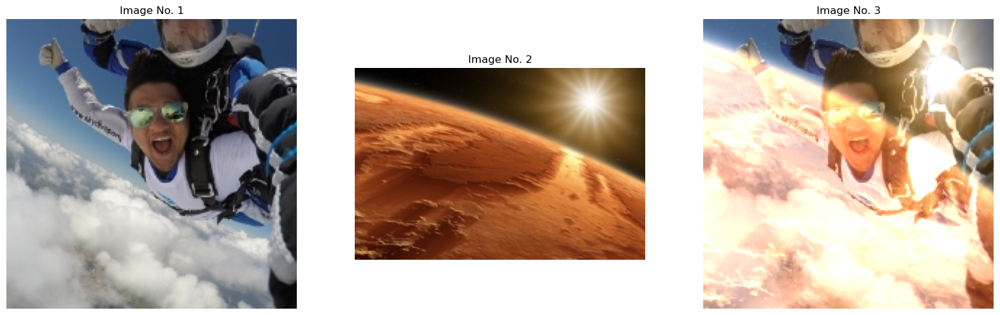

In [14]:
# image addition by avoiding overflow
added_image_no_overflow=image_addition(image1, image2, 1)
display_images([image1,image2,added_image_no_overflow])

C:\Users\TarunBali\AppData\Local\Temp\ipykernel_10048\3335648021.py:35: RuntimeWarning: overflow encountered in scalar add
  r = r1 + r2
C:\Users\TarunBali\AppData\Local\Temp\ipykernel_10048\3335648021.py:36: RuntimeWarning: overflow encountered in scalar add
  g = g1 + g2
C:\Users\TarunBali\AppData\Local\Temp\ipykernel_10048\3335648021.py:37: RuntimeWarning: overflow encountered in scalar add
  b = b1 + b2


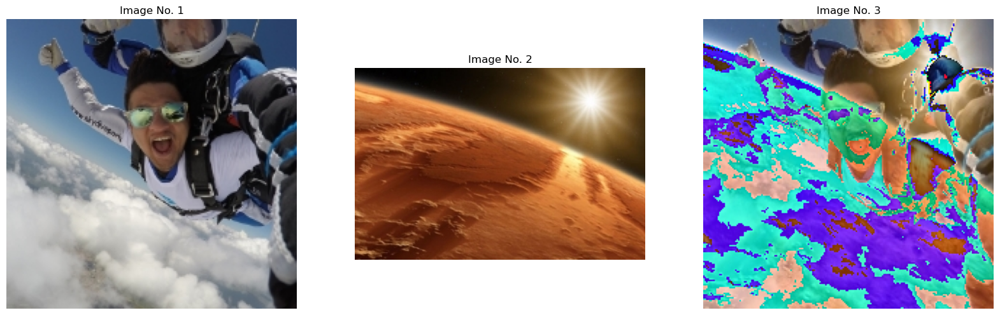

In [15]:
# image addition without avoiding overflow
added_image_overflow=image_addition(image1, image2, 0)
display_images([image1,image2,added_image_overflow])

### Analysis of addition

1. Firstly, we ensured that the two images being added have same dimensions by resizing the second image to match the first image dimensions.
2. Because input images have pixel datatype as "uint8", when we perform pixel addition, sometimes the sum value is exceeding 255 (overflow from the max limit of uint8). This causes values to wrap around the max value 255.
3. I have included another parameter "avoid_overflow (defaul 1)" to perform addition accordingly.
4. The overflow can be avoided by changing the datatype of input images pixel datatype from "unint8" to "uint16", thereby increasing the range and then taking "minimum" of the added value and 255, so that in this case 255 gets assigned to the final added image.
5. When addition is performed by avoiding overflow, I can see that I am getting a resonably looking image, as can be seen above "added_image_no_overflow". See that the image shows Sun and Mars added in my image.
6. When addition is performed without avoiding overflow (see warnings of overflow above), I can see that the added image has unexpected colors as seen above, the figure "added_image_overflow" has uneven blue color which was not expected. This is happening because higher values are getting wrapped around 255.

### Subtraction

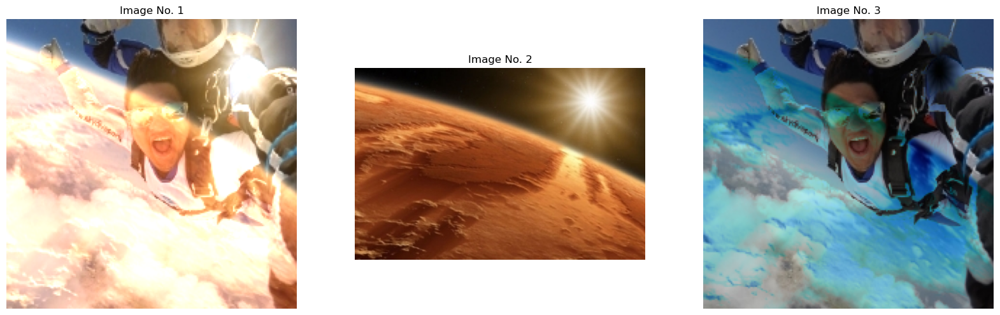

In [16]:
# image subtraction by avoiding overflow
subtracted_image_no_overflow=image_subtraction(added_image_no_overflow,image2, 1)
display_images([added_image_no_overflow,image2,subtracted_image_no_overflow])

C:\Users\TarunBali\AppData\Local\Temp\ipykernel_10048\1550934895.py:35: RuntimeWarning: overflow encountered in scalar subtract
  r = r1 - r2
C:\Users\TarunBali\AppData\Local\Temp\ipykernel_10048\1550934895.py:36: RuntimeWarning: overflow encountered in scalar subtract
  g = g1 - g2
C:\Users\TarunBali\AppData\Local\Temp\ipykernel_10048\1550934895.py:37: RuntimeWarning: overflow encountered in scalar subtract
  b = b1 - b2


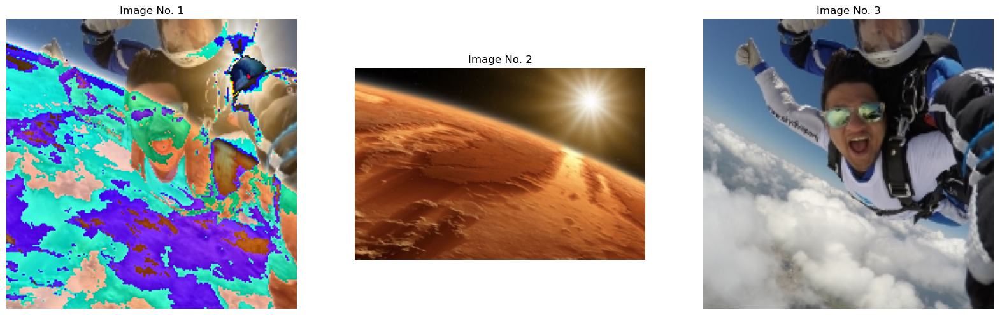

In [17]:
# image subtraction without avoiding overflow
subtracted_image_overflow=image_subtraction(added_image_overflow,image2, 0)
display_images([added_image_overflow,image2,subtracted_image_overflow])

### Analysis of subtraction

1. Firstly, we ensured that the image being subtracted has same dimensions as first image by resizing the second image to match the first image dimensions.
2. Because input images have pixel datatype as "uint8", when we perform pixel subtraction, sometimes the subtracted value is negative (less than 0) (overflow from the min limit of uint8). This causes values to wrap around the min value 0.
3. I have included another parameter "avoid_overflow (defaul 1)" to perform subtraction accordingly.
4. The overflow can be avoided by changing the datatype of input images pixel datatype from "unint8" to "int16", thereby increasing the range by allowing negative intergers too and then taking "maximum" of the subtracted value and 0, so that in this case 0 gets assigned to the final subtracted image.
5. I have performed subtraction by subtracting second image from the result of addition done previously, expecting that I will get first image as the result. (if a + b = c ==> c - b = a )
6. Interestingly, when subtraction is performed by avoiding overflow by subtracting second image from "added_image_no_overflow", I can see that I am not getting an expected image, as can be seen above "subtracted_image_no_overflow". See that the image shows uneven blue color which was not expected. This is happening because we clipped values higher than 255 while performing addition.
7. Interestingly, when subtraction is performed without avoiding overflow (see warnings of overflow above) by subtracting second image from "added_image_overflow", I can see that the result image "subtracted_image_overflow" is looking exactly the same as first image. :)

### Mulitplication

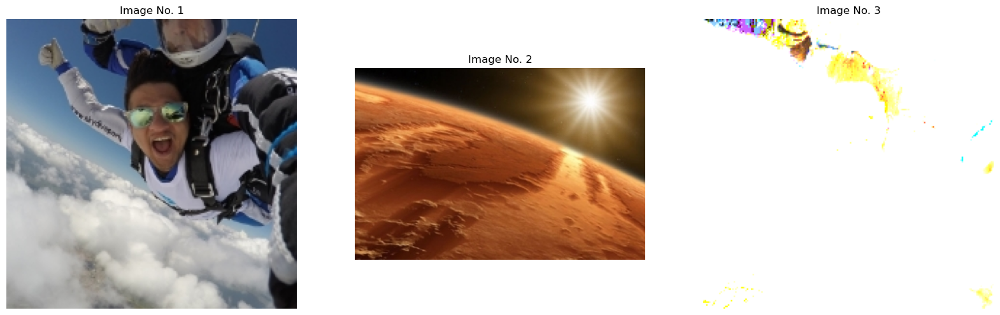

In [18]:
# image multiplication by avoiding overflow
multiplied_image_no_overflow=image_multiplication(image1, image2, 1)
display_images([image1, image2, multiplied_image_no_overflow])

C:\Users\TarunBali\AppData\Local\Temp\ipykernel_10048\3005219332.py:36: RuntimeWarning: overflow encountered in scalar multiply
  g = g1 * g2
C:\Users\TarunBali\AppData\Local\Temp\ipykernel_10048\3005219332.py:37: RuntimeWarning: overflow encountered in scalar multiply
  b = b1 * b2
C:\Users\TarunBali\AppData\Local\Temp\ipykernel_10048\3005219332.py:35: RuntimeWarning: overflow encountered in scalar multiply
  r = r1 * r2


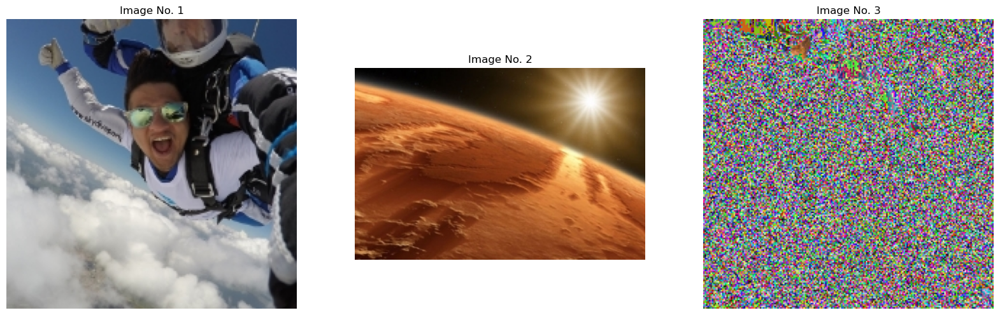

In [19]:
# image multiplication without avoiding overflow
multiplied_image_overflow=image_multiplication(image1, image2, 0)
display_images([image1, image2, multiplied_image_overflow])

### Analysis of multiplication

1. Firstly, we ensured that the images being multiplied have same dimensions by resizing the second image to match the first image dimensions.
2. Because input images have pixel datatype as "uint8", when we perform pixel multiplication, sometimes the multiplied value is exceeding 255 (overflow from the max limit of uint8). This causes values to wrap around the max value 255.
3. I have included another parameter "avoid_overflow (defaul 1)" to perform multiplication accordingly.
4. The overflow can be avoided by changing the datatype of input images pixel datatype from "unint8" to "uint16", thereby increasing the range and then taking "minimum" of the multiplied value and 255, so that in this case 255 gets assigned to the final multiplied image.
5. When multiplication is performed by avoiding overflow, I can see that I am getting an image "multiplied_image_no_overflow" which is mostly "white". This is becuase mulitplication usually produces large values (close to 255).
7. When multiplication is performed without avoiding overflow (see warnings of overflow above), I am getting an unexpected image with a lot of noisy pixels "multiplied_image_overflow". 

### Division

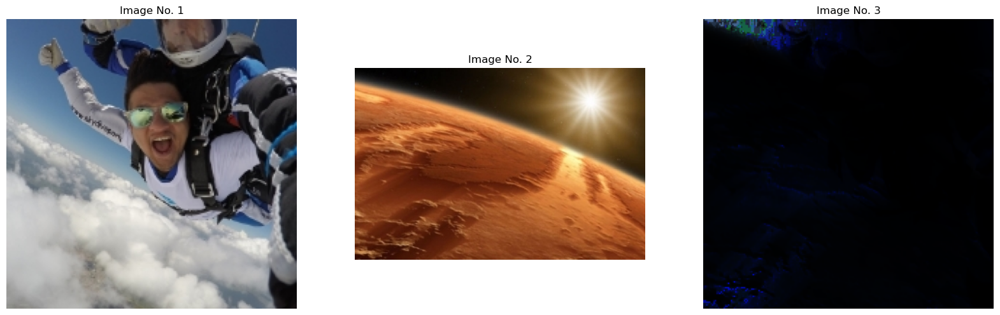

In [20]:
# image division
divided_image=image_division(image1, image2)
display_images([image1, image2, divided_image])

### Analysis of division

1. Firstly, we ensured that the second image dividing the first image, has same dimensions by resizing the second image to match the first image dimensions.
2. In this case we don't get into the problem of overflow, because the division operation for values between 0 to 255 is going to produce values between 0 and 255.
3. However, here the main problem that can occur is division by 0, therefore I have not performed division when the pixel value of second image is 0.
4. Another thing to notice here is that division opertion will produce float values but since the datatype being used is "uint8" so the float gets converted to int, and I haven't changed datatype as this will not produce an unexpected image.
5. We can see that the final image "divided_image" is "mostly black" which means most of the values are small (close to 0). 

### Importance of DataType selection in Image Arithmetic

As it is evident above, that I had to take into account the datatype of the pixel values while performing different arithmetic operation. Therefore, it is very important to consider the type of arithmetic operation and the pixel values of the images being operated on as what data type their pixels are stored in.

The data types directly impact the accuracy and the quality of the final image being produced after the arithmetic operations.
Following points must be considered carefully:
1. Range of the pixel values. We used following data types:
   uint8 ==> 0 to 255
   uint16 ==> 0 to 65535
   int16 ==> -32768 to 32767
   the above data types were used carefully consider the possible values after image arithmetic.
3. Clipping values outside the range of (0,255). Since the final image is being stored in "uint8" data type, I clipped the values outside the range (0,255) which can impact the quality of the image.
4. During Division operation, I could have changed the data type from int to float, to accomodate the decimal pixel values, which can be useful when we have high quality data where rounding errors can impact a lot. Since this assignment is for illustrative purpose, I didn't convert the data type for division operation.
5. Storage requirements: When we change the data type, we also increase the memory requirement to store these pixel values in the memory, such as "uint8" requires 8 bits while "uint16" requires 16 bits.
6. Visual Quality: Changing data type with increased range also leads to better visual quality of the image produced after arithmetic operations.

Considering points above, the images produced above alredy justify these points. Thus we can conlcude that data type selection is very important in Image Arithmetic operations.

## Task 2: Convolution Operation

1. Implement a function for 2D convolution between an image and a kernel (filter).
2. Apply different kernels (e.g., Gaussian, Sobel) to images and observe the effects.
3. Compare your results with built-in convolution functions from libraries like OpenCV.

### Function to perform 2D convolution between an image and a kernel (filter) without using OpenCV

In [21]:
def convolution_2d_without_opencv(image, kernel):
    '''
    The inputs to this function:
    1. image ==> image as numpy array or its path as str
    2. kernel ==> numpy array to be used as filter
    '''
    # read input images
    image=read_image(image)

    #original image dimensions
    height_image, width_image, total_channels = image.shape

    #kernel dimensions
    height_kernel, width_kernel = kernel.shape

    # pre-calculating the dimensions of the result image
    height_conv = height_image - height_kernel + 1
    width_conv = width_image - width_kernel + 1

    # setting up an empty canvas of complete black image to be replaced with image pixels later
    conv_image = np.zeros((height_conv,width_conv, total_channels)).astype("uint8")
    
    # three 'for' loops (for width, height and channel) will calculate and replace every pixel
    for h in range(height_conv):
        for w in range(width_conv):
            for c in range(total_channels):
                
                # Perform element-wise multiplication and summation
                output_pixel = np.sum(image[h:h+height_kernel, w:w+width_kernel, c] * kernel)

                # Assign the result to the result image
                conv_image[h, w, c] = min(output_pixel,255)
    return conv_image

### Gaussian Kernel

In [22]:
gaussian_kernel=np.array([[0.05854983, 0.09653235, 0.05854983],
[0.09653235, 0.15915494, 0.09653235],
[0.05854983, 0.09653235, 0.05854983]])

### Sobel Kernel

In [23]:
# Sobel Horizontal Kernel
sobel_horizontal_kernel=np.array([[1, 2, 1],
[0, 0, 0],
[-1, -2, -1]])

In [24]:
# Sobel Vertical Kernel
sobel_vertical_kernel=np.array([[-1, 0, 1],
[-2, 0, 2],
[-1, 0, 1]])

### 2D Convolution with Gaussian kernel without using OpenCV

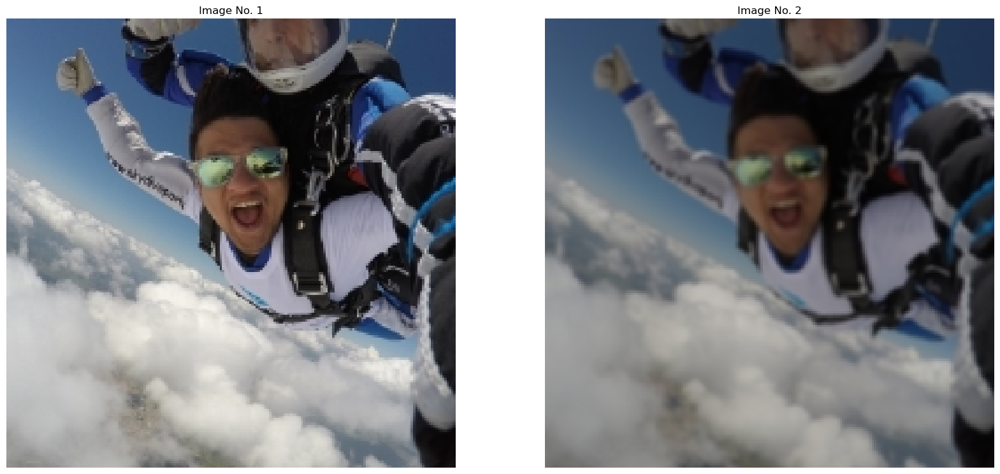

In [25]:
conv_image=convolution_2d_without_opencv(image1, gaussian_kernel)
display_images([image1,conv_image])

### Effect of Gaussian Kernel on the image

It can be observed that Guassian Kernel has smoothen the image by blurring it a little, in effect reducing the noise from the input image.
The blurring effect is quite low which is becuase Gaussian Kernel dimensions (3 x 3) are very small as compared to my image's very large dimensions (1536 x 1536). Thus very little effect on the image.

### 2D Convolution with Sobel kernel without using OpenCV

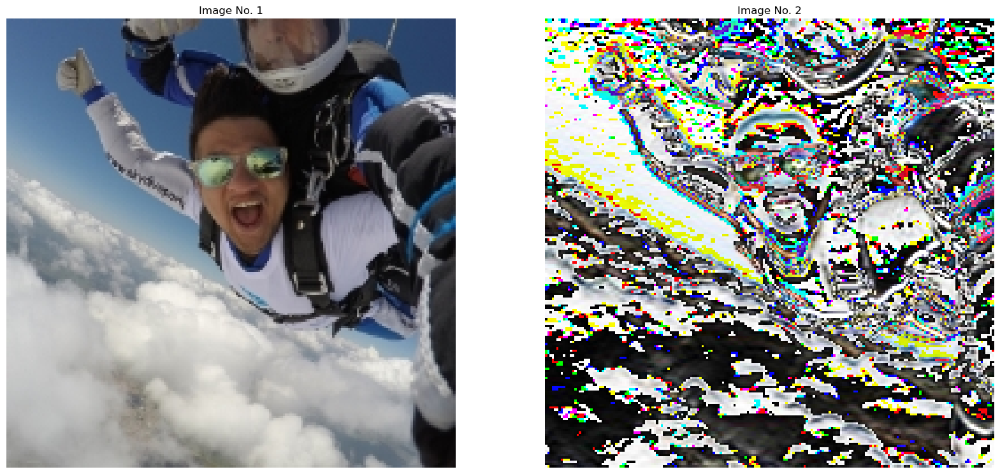

In [26]:
# applying horizontal sobel kernel to the input image
horizontal_edges_image=convolution_2d_without_opencv(image1, sobel_horizontal_kernel)
display_images([image1,horizontal_edges_image])

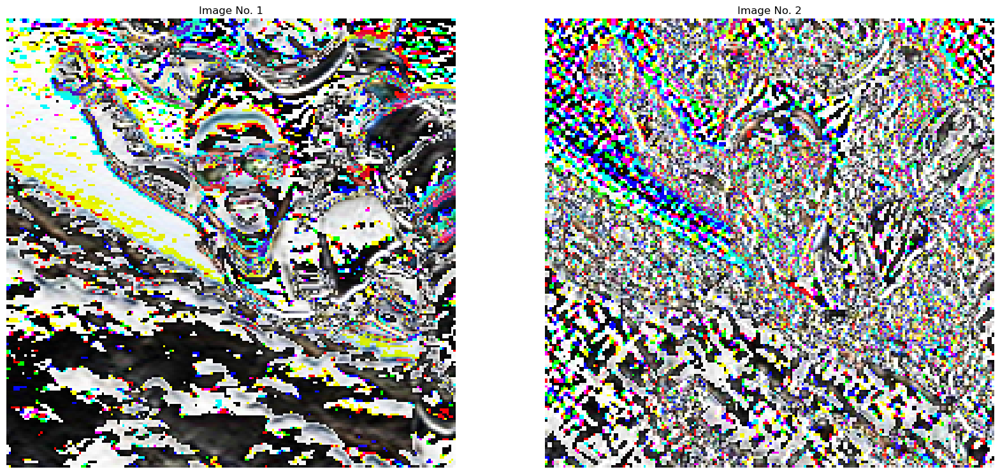

In [27]:
# applying vertical sobel kernel to the image produced above
vertical_horizontal_edges_image=convolution_2d_without_opencv(horizontal_edges_image, sobel_vertical_kernel)
display_images([horizontal_edges_image,vertical_horizontal_edges_image])

### Effect of Sobel Kernel on the image

It can be seen that Sobel Kernel has detected edges (both horizonal and vertical) in the input image. In my image above, it looks like a lot of such edges have been detected. This is happening because my image has very large dimensions (1536 x 1536) as compared to the Sobel Kernel dimensions (3 x 3), therefore the edges at very small level are being detected here.

### Function to perform 2D convolution between an image and Gaussian kernel (filter) using OpenCV

In [28]:
def convolution_2d_with_opencv_gaussian(image, kernel):
    '''
    The inputs to this function:
    1. image ==> image as numpy array or its path as str
    2. kernel ==> numpy array to be used as filter
    '''
    # read input image
    image=read_image(image)

    # apply 2D convolution using OpenCV
    conv_image=cv2.filter2D(image, -1, kernel)
    
    return conv_image

### 2D Convolution with Gaussian kernel using OpenCV

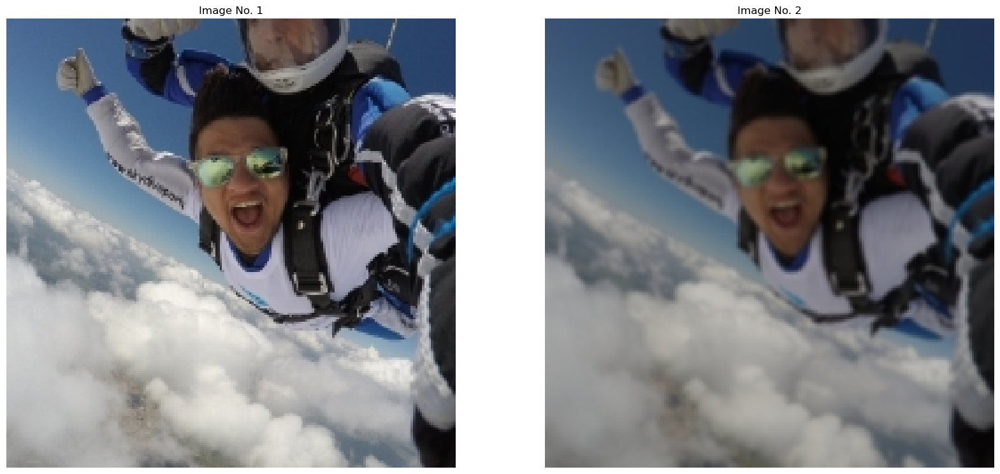

In [29]:
conv_image=convolution_2d_with_opencv_gaussian(image1,gaussian_kernel)
display_images([image1,conv_image])

### Comparison of 2D Gaussian Convolution using OpenCV and not using OpenCV

It can be observed that the output images produced by using OpenCV and without using OpenCV, both look quite similar.

### Function to perform 2D convolution between an image and Sobel kernel (filter) using OpenCV

In [30]:
def convolution_2d_with_opencv_sobel(image):
    '''
    The inputs to this function:
    1. image ==>  image as numpy array or its path as str
    '''
    # read input image
    image=read_image(image)

    # Apply sobel_x filter to the input image using 3x3 sobel_x filter
    sobelx = cv2.Sobel(image,cv2.CV_64F,1,0,ksize=3)
    # Apply sobel_y filter to the image formed after applying sobel_x filter using 3x3 sobel_y filter
    conv_image = cv2.Sobel(sobelx,cv2.CV_64F,0,1,ksize=3)
    
    return conv_image

### 2D Convolution with Sobel kernel using OpenCV

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


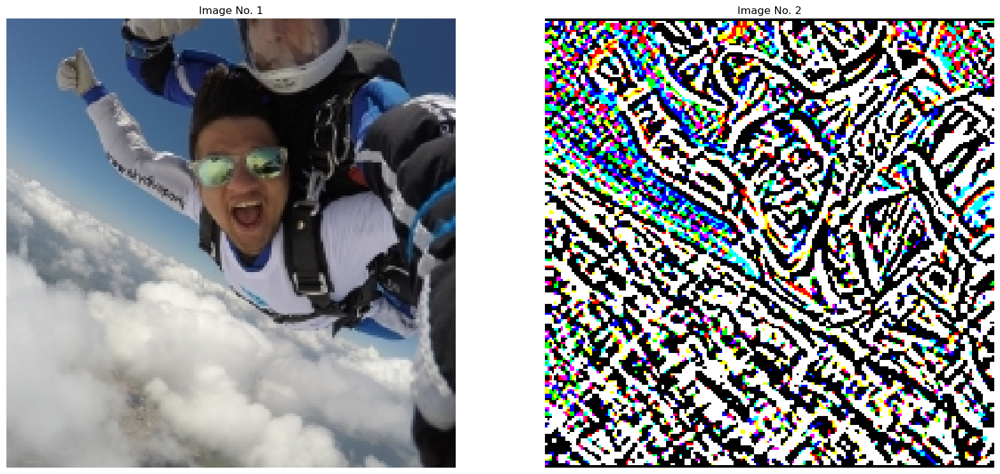

In [31]:
conv_image=convolution_2d_with_opencv_sobel(image1)
display_images([image1,conv_image])

### Comparison of 2D Sobel Convolution using OpenCV and not using OpenCV

It can be observed that the output images produced by using OpenCV and without using OpenCV (applying both horizontal and vertical kernels), both look quite similar.

## Task 3: Image Smoothing and Sharpening

1. Implement functions for image smoothing using techniques like box filtering and Gaussian filtering.
2. Implement a function for image sharpening using techniques like Laplacian filtering.
3. Apply these operations to a set of images and discuss the visual differences and their implications.

### Function to perform image smoothing using box filtering without using OpenCV

In [32]:
def image_smoothing_box_filtering(image, kernel_size):
    '''
    The inputs to this function:
    1. image ==> image as numpy array or its path as str
    2. kernel_size ==> integer (odd number) for kernel size
    '''
    # ensure that kernel_size is an odd integer
    if kernel_size % 2 == 0:
        raise ValueError("Kernel size must be an odd number")

    # read input image
    image=read_image(image)

    #original image dimensions
    height_image, width_image, total_channels = image.shape

    #kernel dimension
    half_kernel = kernel_size // 2

    # setting up an empty canvas of complete black image to be replaced with image pixels later
    smoothed_image = np.zeros(image.shape).astype("uint8")

    # three 'for' loops (for width, height and channel) will calculate and replace every pixel
    for h in range(height_image):
        for w in range(width_image):
            for c in range(total_channels):
                total = 0
                count = 0

                for ky in range(-half_kernel, half_kernel + 1):
                    for kx in range(-half_kernel, half_kernel + 1):
                        # Calculate the coordinates of the current kernel element
                        ny = h + ky
                        nx = w + kx

                        # Check if the coordinates are within the image boundaries
                        if 0 <= ny < height_image and 0 <= nx < width_image:
                            total += image[ny, nx, c]
                            count += 1

                # Set the smoothed pixel value to the average of the kernel elements
                smoothed_image[h, w, c] = total // count

    return smoothed_image

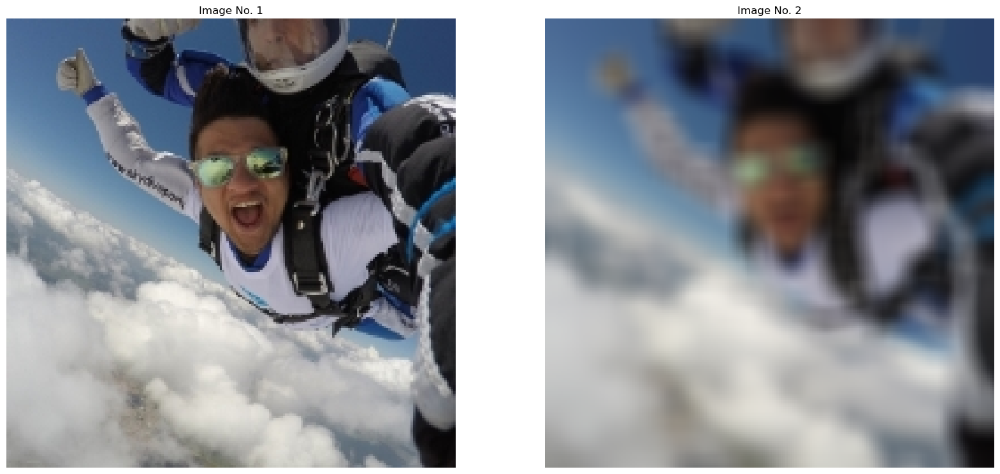

In [33]:
smoothed_image = image_smoothing_box_filtering(image1, 11)
display_images([image1,smoothed_image])

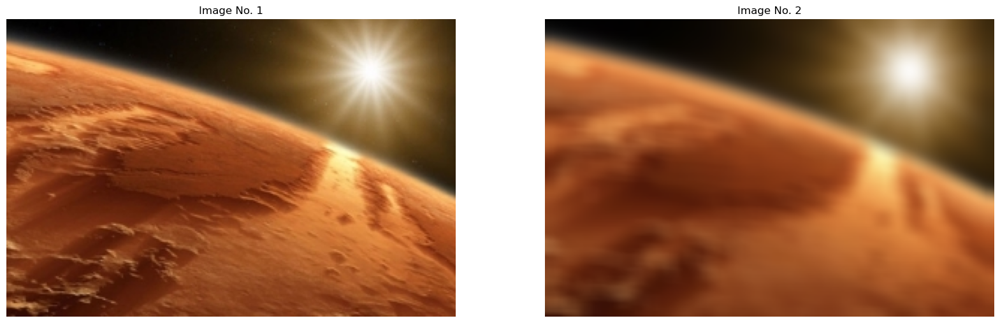

In [34]:
smoothed_image = image_smoothing_box_filtering(image2, 11)
display_images([image2,smoothed_image])

### Implications of Image Smoothing using box filtering

It can be seen above that the filtered image produced has been smoothed. The blurring effect is more than what I saw above while applying Gaussian filter, the main reason of this difference is that here I used 11 x 11 kernel while in the previous section I was using 3 x 3 kernel.
Box filter is smoothing the image by averaging each pixel according to its surrounding pixels, thereby reducing noise in the final image.

### Function to perform image smoothing using Gaussian filtering without using OpenCV

Image Smoothing using Gaussian filtering can be easily done with the function "convolution_2d_without_opencv(image, kernel)" already implemented above without using OpenCV.
We just have to provide the "gaussian_kernel" as the input to this function along with the input image. 

This has been already demonstrated above.

### Function to perform image sharpening using Laplacian filtering without using OpenCV

In [35]:
def image_sharpening_laplacian_filtering(image):
    '''
    The input to this function:
    1. image ==> image as numpy array or its path as str
    '''
    # read input image
    image=read_image(image)

    # define laplacian kernel
    laplacian_kernel=np.array([[0, 1, 0],[1, -4, 1],[0, 1, 0]])

    # apply 2D convolution to the image using laplacian kernel
    conv_image=convolution_2d_without_opencv(image, laplacian_kernel)

    # adding the conv_image to the original image
    sharpened_image=image_addition(image, conv_image, 1)
    
    return sharpened_image

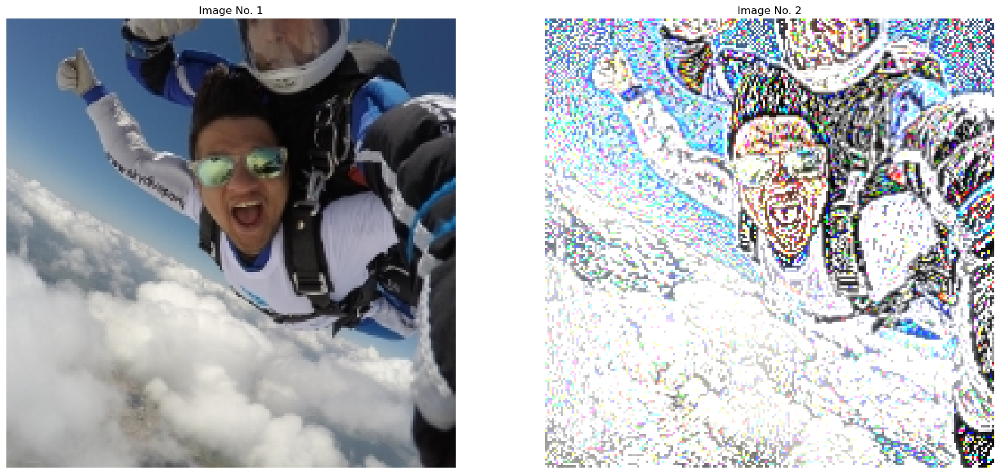

In [36]:
sharpened_image=image_sharpening_laplacian_filtering(image1)
display_images([image1,sharpened_image])

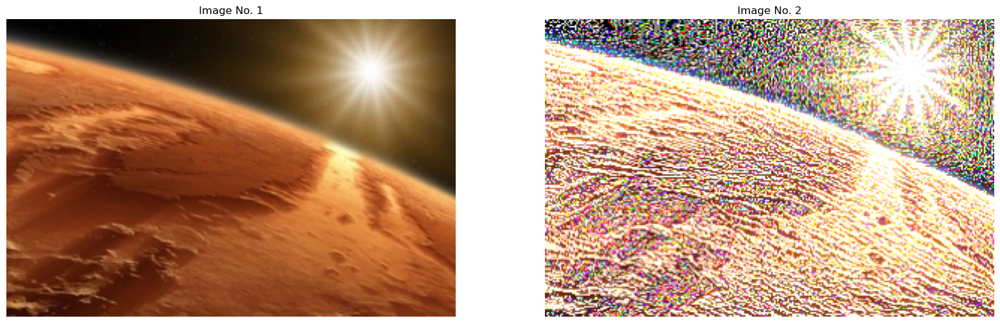

In [37]:
sharpened_image=image_sharpening_laplacian_filtering(image2)
display_images([image2,sharpened_image])

### Implications of Image Sharpening using Laplacian filtering

It can be seen above that the output image produced has been sharpened. That is, the fine details/edges in the images have been highlighted specially where the intensity is changing rapidly like around the Sun in the image above. Thus it can be seen that Laplacian filtering can be used to restore the fine details of the images which have been smoothed to remove noise.

## Task 4: Edge Detection

1. Implement functions for edge detection using techniques like the Sobel operator or Canny edge detector.
2. Apply these edge detection techniques to images and visualize the detected edges.
3. Discuss the challenges and limitations of edge detection algorithms.

In [38]:
def canny_edge_detection(image, low_threshold, high_threshold):
    '''
    The inputs to this function:
    1. image ==> image as numpy array or its path as str
    2. low_threshold ==> lower range for pixel gradient to be accepted as an edge 
    3. high_threshold ==> minimum value for pixel gradient to be accepted as a strong edge
    '''
    # read input image
    image=read_image(image)

    #apply gaussian smoothing to the image
    image = convolution_2d_without_opencv(image, gaussian_kernel)

    #convert image from RGB to Gray
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    #apply sobel vertical and horizontal convolution to the image
    vertical = ndimage.convolve(image, sobel_vertical_kernel)
    horizontal = ndimage.convolve(image, sobel_horizontal_kernel)

    #calculating gradient for non-max suppression
    gradient_magnitude = np.sqrt(vertical**2 + horizontal**2)
    gradient_direction = np.arctan2(horizontal, vertical)

    # apply non-max suppression to get suppressed image
    rows, cols = gradient_magnitude.shape
    non_max_suppressed_image = np.zeros_like(gradient_magnitude)
    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            direction = gradient_direction[i, j]
            
            if (0 <= direction < np.pi/8) or (15*np.pi/8 <= direction <= 2*np.pi):
                neighbors = (gradient_magnitude[i, j+1], gradient_magnitude[i, j-1])
            elif (np.pi/8 <= direction < 3*np.pi/8):
                neighbors = (gradient_magnitude[i-1, j+1], gradient_magnitude[i+1, j-1])
            elif (3*np.pi/8 <= direction < 5*np.pi/8):
                neighbors = (gradient_magnitude[i-1, j], gradient_magnitude[i+1, j])
            else:
                neighbors = (gradient_magnitude[i-1, j-1], gradient_magnitude[i+1, j+1])
            
            if gradient_magnitude[i, j] >= max(neighbors):
                non_max_suppressed_image[i, j] = gradient_magnitude[i, j]


    #fixing the range for strong and weak edges
    strong_edges = (non_max_suppressed_image >= high_threshold)
    weak_edges = (low_threshold <= non_max_suppressed_image) & (non_max_suppressed_image < high_threshold)

    #calculating strong edges to be returned as final image
    for i in range(1, non_max_suppressed_image.shape[0] - 1):
        for j in range(1, non_max_suppressed_image.shape[1] - 1):
            if weak_edges[i, j]:
                if np.any(strong_edges[i-1:i+2, j-1:j+2]):
                    strong_edges[i, j] = True
                else:
                    weak_edges[i, j] = False
    
    return strong_edges


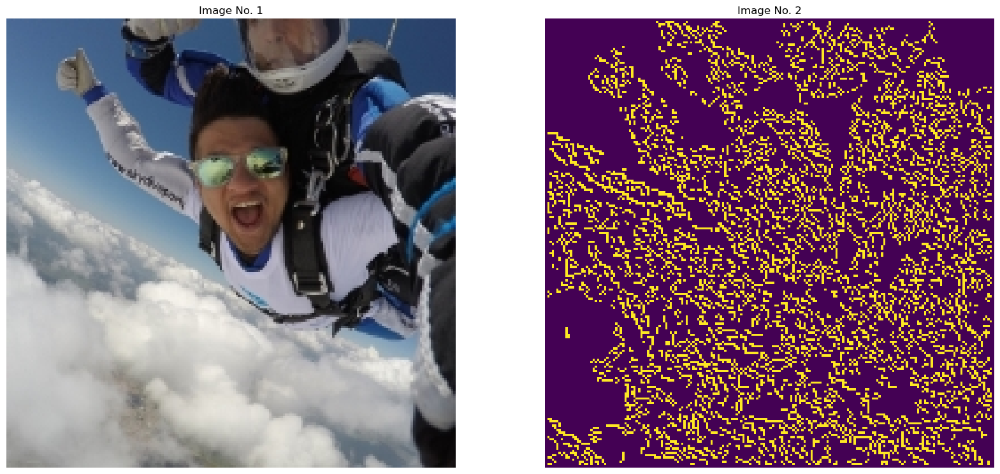

In [39]:
# edges detected using canny edge detector
canny=canny_edge_detection(image1,10, 15)
display_images([image1, canny])

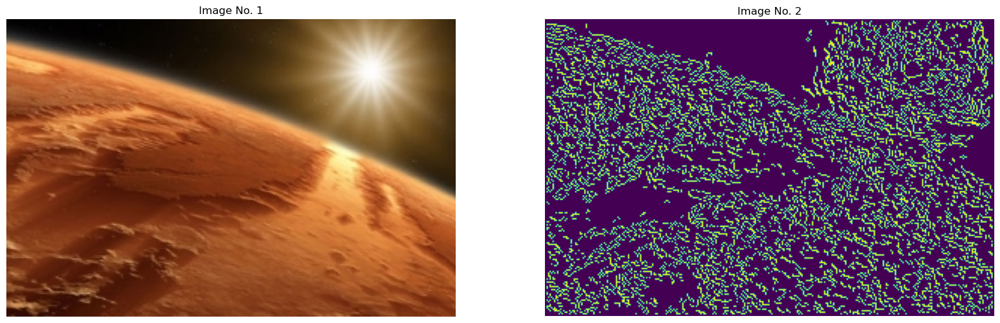

In [40]:
# edges detected using canny edge detector
canny=canny_edge_detection(image2,10, 15)
display_images([image2, canny])

We can see that Canny Edge detector has clearly detected edges in the above images even at very low level.

### Edge detection using Sobel operator

The edge detection using Sobel operator involving both Horizontal and Vertical kernels has already been implemented and demonstrated above.

### Challenges and limitations of edge detection algorithms

Canny edge detection and Sobel edge detection algorithms as seen above are go in detecting edgesod, but still there are many challenges and limitation involved with such edge detection algorithms. These are as follows:


1. Noise Sensitivity: Edge detection algorithms are often sensitive to noise in the image. Small variations in pixel values can lead to false edges or missed edges, making noise reduction a critical preprocessing step. That's why I used Gaussian Smoothing in the Canny Edge Detection function above.

2. Parameters: Many edge detection algorithms require careful tuning of parameters such as threshold values, kernel sizes, and filter types. Finding the right set of parameters for a specific image or application can be challenging.

3. Scale and Rotation Invariance: Most edge detection methods are not inherently scale or rotation invariant. Edges may appear differently when an object is scaled or rotated, requiring additional processing steps for robustness.

4. Weak Edges: Some edge detection techniques may not detect weak or faint edges effectively. This limitation can be problematic when dealing with low-contrast images or objects with subtle boundaries.

5. Complex Object Boundaries: Detecting edges in images with complex object boundaries, such as textured or irregular surfaces, can be challenging. Algorithms may produce fragmented or inaccurate results in such cases.

6. Gradient Direction: In some situations, edge detection algorithms may not provide clear information about the direction of the edge gradient, making it difficult to distinguish between object boundaries and shadow or shading effects.

7. Image Quality: Changes in lighting conditions, image quality, or object appearance may affect edge detection severely.
 
8. Computational Resources: Some advanced edge detection techniques, such as deep learning-based methods, can be computationally intensive and may require powerful hardware for efficient processing.

9. Incorrect Boundaries: Edge detection algorithms might extend edges slightly beyond the actual object boundaries, leading to inaccuracies in object localization.

10. Color Images: Most traditional edge detection methods operate on grayscale images. Adapting these algorithms to handle color images involves additional complexity and considerations.

These challenges and limitations highlight the need for careful selection and customization of edge detection techniques based on the specific requirements of the task and the characteristics of the images being processed.